<a href="https://colab.research.google.com/github/ShivinM-17/Chronic_kidney_disease_XAI/blob/main/Chronic_kidney_detection_with_XAI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Chronic Kidney Disease with XAI for model prediction explanability


### Importing the modules and packages

In [ ]:
# General modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [ ]:
# Modules for preprocessing, hyperparameters testing and evaluation statistics
import random
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report

In [ ]:
!pip -q install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.5/98.5 MB 6.1 MB/s eta 0:00:00


In [ ]:
# modules for model training
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
import lightgbm as lgb
from scipy.stats import randint, uniform
from google.colab import drive
import os
from keras.models import Sequential
from keras.layers import LSTM, Dense
from tensorflow.keras.utils import to_categorical

In [ ]:
import pickle

# To ignore unwanted warnings
import warnings
warnings.filterwarnings('ignore')

# for styling
plt.style.use('seaborn-whitegrid')

### Load and checkout the data

In [ ]:
# Load the dataset via its path
csv_path = "/content/kidney_disease (1).csv"
data = pd.read_csv(csv_path)
data.head()

,id,age,bp,sg,al,su,rbc,pc,pcc,ba,...,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
0,0,48.0,80.0,1.020,1.0,0.0,NaN,normal,notpresent,notpresent,...,44,7800,5.2,yes,yes,no,good,no,no,ckd
1,1,7.0,50.0,1.020,4.0,0.0,NaN,normal,notpresent,notpresent,...,38,6000,NaN,no,no,no,good,no,no,ckd
2,2,62.0,80.0,1.010,2.0,3.0,normal,normal,notpresent,notpresent,...,31,7500,NaN,no,yes,no,poor,no,yes,ckd
3,3,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,...,32,6700,3.9,yes,no,no,poor,yes,yes,ckd
4,4,51.0,80.0,1.010,2.0,0.0,normal,normal,notpresent,notpresent,...,35,7300,4.6,no,no,no,good,no,no,ckd


In [ ]:
# Check the shape of the data
data.shape

(400, 26)

In [ ]:
# Drop the `id` column since of no use
data = data.drop('id', axis = 1)
data.head(5)

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,...,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
0,48.0,80.0,1.020,1.0,0.0,NaN,normal,notpresent,notpresent,121.0,...,44,7800,5.2,yes,yes,no,good,no,no,ckd
1,7.0,50.0,1.020,4.0,0.0,NaN,normal,notpresent,notpresent,NaN,...,38,6000,NaN,no,no,no,good,no,no,ckd
2,62.0,80.0,1.010,2.0,3.0,normal,normal,notpresent,notpresent,423.0,...,31,7500,NaN,no,yes,no,poor,no,yes,ckd
3,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,117.0,...,32,6700,3.9,yes,no,no,poor,yes,yes,ckd
4,51.0,80.0,1.010,2.0,0.0,normal,normal,notpresent,notpresent,106.0,...,35,7300,4.6,no,no,no,good,no,no,ckd


In [ ]:
# Change the name of the columns for better representation
data.columns = ['age',
                'blood_pressure',
                'specific_gravity',
                'albumin',
                'sugar',
                'red_blood_cells',
                'pus_cell',
                'pus_cell_clumps',
                'bacteria',
                'blood_glucose_random',
                'blood_urea',
                'serum_creatinine',
                'sodium',
                'potassium',
                'haemoglobin',
                'packed_cell_volume',
                'white_blood_cell_count',
                'red_blood_cell_count',
                'hypertension',
                'diabetes_mellitus',
                'coronary_artery_disease',
                'appetite',
                'peda_edema',
                'aanemia',
                'class',
               ]

In [ ]:
# Check the datatypes of the data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 25 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   age                      391 non-null    float64
 1   blood_pressure           388 non-null    float64
 2   specific_gravity         353 non-null    float64
 3   albumin                  354 non-null    float64
 4   sugar                    351 non-null    float64
 5   red_blood_cells          248 non-null    object 
 6   pus_cell                 335 non-null    object 
 7   pus_cell_clumps          396 non-null    object 
 8   bacteria                 396 non-null    object 
 9   blood_glucose_random     356 non-null    float64
 10  blood_urea               381 non-null    float64
 11  serum_creatinine         383 non-null    float64
 12  sodium                   313 non-null    float64
 13  potassium                312 non-null    float64
 14  haemoglobin              3

In [ ]:
# Get the unique values count of the data
data.nunique()

age                         76
blood_pressure              10
specific_gravity             5
albumin                      6
sugar                        6
red_blood_cells              2
pus_cell                     2
pus_cell_clumps              2
bacteria                     2
blood_glucose_random       146
blood_urea                 118
serum_creatinine            84
sodium                      34
potassium                   40
haemoglobin                115
packed_cell_volume          44
white_blood_cell_count      92
red_blood_cell_count        49
hypertension                 2
diabetes_mellitus            5
coronary_artery_disease      3
appetite                     2
peda_edema                   2
aanemia                      2
class                        3
dtype: int64

In [ ]:
# Print out the unique values of each column
for column in data.columns:
  if data[column].nunique() <= 10:
    print(f"{column} -> {data[column].nunique()}: {data[column].unique().tolist()} ; \ndtype: {data[column].dtype}\n")

blood_pressure -> 10: [80.0, 50.0, 70.0, 90.0, nan, 100.0, 60.0, 110.0, 140.0, 180.0, 120.0] ; 
dtype: float64

specific_gravity -> 5: [1.02, 1.01, 1.005, 1.015, nan, 1.025] ; 
dtype: float64

albumin -> 6: [1.0, 4.0, 2.0, 3.0, 0.0, nan, 5.0] ; 
dtype: float64

sugar -> 6: [0.0, 3.0, 4.0, 1.0, nan, 2.0, 5.0] ; 
dtype: float64

red_blood_cells -> 2: [nan, 'normal', 'abnormal'] ; 
dtype: object

pus_cell -> 2: ['normal', 'abnormal', nan] ; 
dtype: object

pus_cell_clumps -> 2: ['notpresent', 'present', nan] ; 
dtype: object

bacteria -> 2: ['notpresent', 'present', nan] ; 
dtype: object

hypertension -> 2: ['yes', 'no', nan] ; 
dtype: object

diabetes_mellitus -> 5: ['yes', 'no', ' yes', '\tno', '\tyes', nan] ; 
dtype: object

coronary_artery_disease -> 3: ['no', 'yes', '\tno', nan] ; 
dtype: object

appetite -> 2: ['good', 'poor', nan] ; 
dtype: object

peda_edema -> 2: ['no', 'yes', nan] ; 
dtype: object

aanemia -> 2: ['no', 'yes', nan] ; 
dtype: object

class -> 3: ['ckd', 'ckd\t', '

In [ ]:
# Check the count of missing values in the data
data.isnull().sum()

age                          9
blood_pressure              12
specific_gravity            47
albumin                     46
sugar                       49
red_blood_cells            152
pus_cell                    65
pus_cell_clumps              4
bacteria                     4
blood_glucose_random        44
blood_urea                  19
serum_creatinine            17
sodium                      87
potassium                   88
haemoglobin                 52
packed_cell_volume          70
white_blood_cell_count     105
red_blood_cell_count       130
hypertension                 2
diabetes_mellitus            2
coronary_artery_disease      2
appetite                     1
peda_edema                   1
aanemia                      1
class                        0
dtype: int64

### Preprocessing the data

In [ ]:
# Remove column `red_blood_cells` since more than 30% data missing
data = data.drop('red_blood_cells', axis = 1)
data.columns

Index(['age', 'blood_pressure', 'specific_gravity', 'albumin', 'sugar',
       'pus_cell', 'pus_cell_clumps', 'bacteria', 'blood_glucose_random',
       'blood_urea', 'serum_creatinine', 'sodium', 'potassium', 'haemoglobin',
       'packed_cell_volume', 'white_blood_cell_count', 'red_blood_cell_count',
       'hypertension', 'diabetes_mellitus', 'coronary_artery_disease',
       'appetite', 'peda_edema', 'aanemia', 'class'],
      dtype='object')

In [ ]:
data.head()

,age,blood_pressure,specific_gravity,albumin,sugar,pus_cell,pus_cell_clumps,bacteria,blood_glucose_random,blood_urea,...,packed_cell_volume,white_blood_cell_count,red_blood_cell_count,hypertension,diabetes_mellitus,coronary_artery_disease,appetite,peda_edema,aanemia,class
0,48.0,80.0,1.020,1.0,0.0,normal,notpresent,notpresent,121.0,36.0,...,44,7800,5.2,yes,yes,no,good,no,no,ckd
1,7.0,50.0,1.020,4.0,0.0,normal,notpresent,notpresent,NaN,18.0,...,38,6000,NaN,no,no,no,good,no,no,ckd
2,62.0,80.0,1.010,2.0,3.0,normal,notpresent,notpresent,423.0,53.0,...,31,7500,NaN,no,yes,no,poor,no,yes,ckd
3,48.0,70.0,1.005,4.0,0.0,abnormal,present,notpresent,117.0,56.0,...,32,6700,3.9,yes,no,no,poor,yes,yes,ckd
4,51.0,80.0,1.010,2.0,0.0,normal,notpresent,notpresent,106.0,26.0,...,35,7300,4.6,no,no,no,good,no,no,ckd


In [ ]:
# convert the appropriate columns to numeric
cols_to_num = ['packed_cell_volume', 'white_blood_cell_count', 'red_blood_cell_count']
data[cols_to_num] = data[cols_to_num].apply(pd.to_numeric, errors='coerce')

In [ ]:
# Remove tab spaces from the data columns
cols_to_remove_tabs = ['diabetes_mellitus', 'coronary_artery_disease', 'class']
data[cols_to_remove_tabs] = data[cols_to_remove_tabs].apply(lambda col: col.str.strip('\t').str.strip())

In [ ]:
# Encode the values in the object columns
cols_with_yes_no = ['hypertension', 'diabetes_mellitus', 'coronary_artery_disease', 'peda_edema', 'aanemia']
cols_with_pr_npr = ['pus_cell_clumps', 'bacteria']

# Now, encode the columns
data[cols_with_yes_no] = data[cols_with_yes_no].replace({"yes": 1, "no": 0})
data[cols_with_pr_npr] = data[cols_with_pr_npr].replace({"notpresent": 0, "present":1})
data['pus_cell'] = data['pus_cell'].replace({'normal': 1, 'abnormal': 0})
data['appetite'] = data['appetite'].replace({'good': 1, 'poor': 0})
data['class'] = data['class'].replace({'ckd': 1, 'notckd': 0})

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 24 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   age                      391 non-null    float64
 1   blood_pressure           388 non-null    float64
 2   specific_gravity         353 non-null    float64
 3   albumin                  354 non-null    float64
 4   sugar                    351 non-null    float64
 5   pus_cell                 335 non-null    float64
 6   pus_cell_clumps          396 non-null    float64
 7   bacteria                 396 non-null    float64
 8   blood_glucose_random     356 non-null    float64
 9   blood_urea               381 non-null    float64
 10  serum_creatinine         383 non-null    float64
 11  sodium                   313 non-null    float64
 12  potassium                312 non-null    float64
 13  haemoglobin              348 non-null    float64
 14  packed_cell_volume       3

In [ ]:
# Check the count of missing values
data.isnull().sum()

age                          9
blood_pressure              12
specific_gravity            47
albumin                     46
sugar                       49
pus_cell                    65
pus_cell_clumps              4
bacteria                     4
blood_glucose_random        44
blood_urea                  19
serum_creatinine            17
sodium                      87
potassium                   88
haemoglobin                 52
packed_cell_volume          71
white_blood_cell_count     106
red_blood_cell_count       131
hypertension                 2
diabetes_mellitus            2
coronary_artery_disease      2
appetite                     1
peda_edema                   1
aanemia                      1
class                        0
dtype: int64

In [ ]:
# Fill the missing values in the columns
# Categorical data columns
cat_cols = [col for col in data.columns if data[col].nunique()<=10]
# Numerical data columns
num_cols = [col for col in data.columns if col not in cat_cols]

In [ ]:
# Perform mode imputation for the categorical columns
for col in cat_cols:
  data[col].fillna(data[col].mode().iloc[0], inplace=True)

In [ ]:
# Perform moving average imputation for the numerical columns
window_size = 5
for col in num_cols:
  data[col].fillna(data[col].rolling(window=window_size, min_periods=1).mean(), inplace=True)

In [ ]:
# If any missing value left, impute them with mean
for col in num_cols:
  data[col].fillna(data[col].mean(), inplace=True)

In [ ]:
# Check the count of missing values
data.isnull().sum()

age                        0
blood_pressure             0
specific_gravity           0
albumin                    0
sugar                      0
pus_cell                   0
pus_cell_clumps            0
bacteria                   0
blood_glucose_random       0
blood_urea                 0
serum_creatinine           0
sodium                     0
potassium                  0
haemoglobin                0
packed_cell_volume         0
white_blood_cell_count     0
red_blood_cell_count       0
hypertension               0
diabetes_mellitus          0
coronary_artery_disease    0
appetite                   0
peda_edema                 0
aanemia                    0
class                      0
dtype: int64

### Visualize some relationships between columns

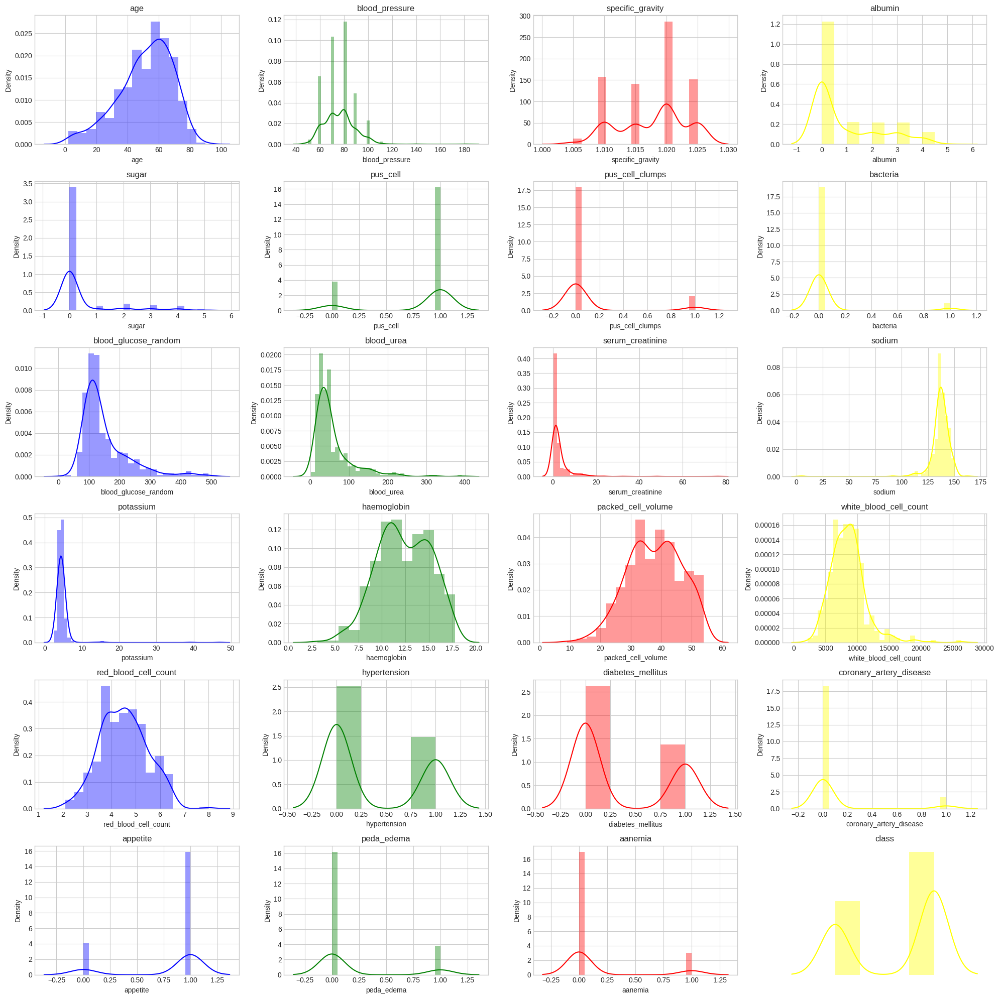

In [ ]:
n_rows = 6
n_cols = 4
fig, axes = plt.subplots(n_rows, n_cols, figsize = (20, 20))
axes = axes.flatten()

color = ['blue', 'green', 'red', 'yellow']

for index, column in enumerate(data.columns):
  ax = axes[index]
  sns.distplot(data[column], ax = ax, color=color[index%4])
  ax.set_title(column)
plt.tight_layout()
plt.axis(False);

Considerable amount of data imbalance can be observed from the data representations.

```
Columns: ['bacteria', 'pus_cell_clumps', 'coronary_artery_disease', 'anaemia', 'appetite', 'peda_edema']
```

<Axes: xlabel='class', ylabel='Density'>

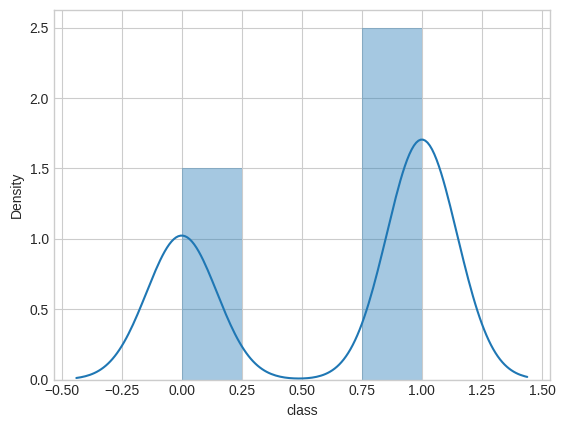

In [ ]:
sns.distplot(data['class'])

No class imbalance, since the ratio of the classes is about 2.5: 1.5

<Axes: >

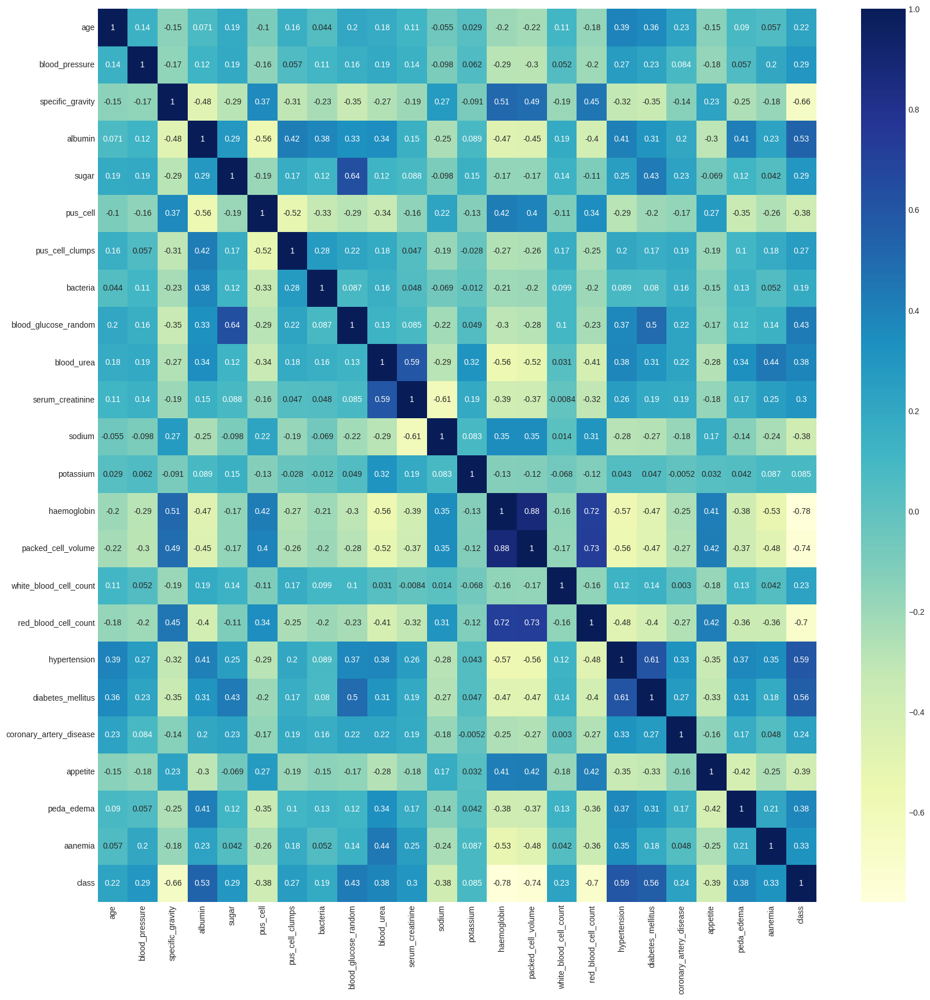

In [ ]:
# Create a correlation matrix
corr = data.corr()

plt.figure(figsize=(20, 20))
sns.heatmap(corr, cmap="YlGnBu", annot=True)

### Removing data imbalance in the independent variables of the data

In [ ]:
# Remove columns with high correlation
cols_to_remove = ['red_blood_cell_count', 'haemoglobin', 'blood_urea', 'packed_cell_volume', 'specific_gravity', 'sodium']

data_prp = data.copy()

# Remove the columns
data_prp.drop(cols_to_remove, axis=1, inplace=True)

<Axes: >

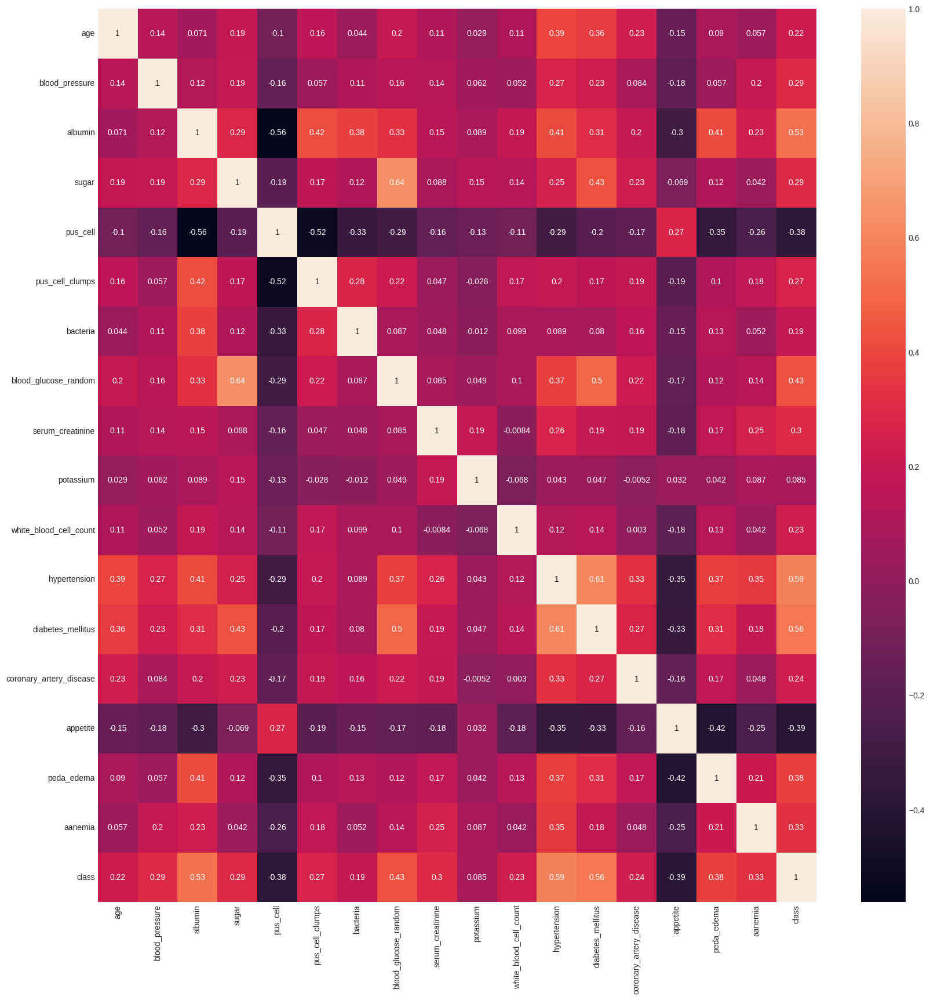

In [ ]:
# Create the heatmap
corr = data_prp.corr()

plt.figure(figsize=(20, 20))
sns.heatmap(corr, annot = True)

### Normalize and standardize the both the data

In [ ]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler
ms = MinMaxScaler()
ss = StandardScaler()

In [ ]:
# First, split to dependendent and independent variables
X_nofeat = data.drop('class', axis=1)
y_nofeat = data['class']

X_feat = data_prp.drop('class', axis=1)
y_feat = data_prp['class']

In [ ]:
# Normalize the data
X_nofeat_norm = ms.fit_transform(X_nofeat)
X_nofeat_norm

X_feat_norm = ms.fit_transform(X_feat)
X_feat_norm

array([[0.52272727, 0.23076923, 0.2       , ..., 1.        , 0.        ,
        0.        ],
       [0.05681818, 0.        , 0.8       , ..., 1.        , 0.        ,
        0.        ],
       [0.68181818, 0.23076923, 0.4       , ..., 0.        , 0.        ,
        1.        ],
       ...,
       [0.11363636, 0.23076923, 0.        , ..., 1.        , 0.        ,
        0.        ],
       [0.17045455, 0.07692308, 0.        , ..., 1.        , 0.        ,
        0.        ],
       [0.63636364, 0.23076923, 0.        , ..., 1.        , 0.        ,
        0.        ]])

In [ ]:
# Standardize the data
X_nofeat_std = ss.fit_transform(X_nofeat)
X_nofeat_std

X_feat_std = ss.fit_transform(X_feat)
X_feat_std

array([[-0.20118228,  0.25421378,  0.07624929, ...,  0.50780078,
        -0.4843221 , -0.42008403],
       [-2.59638331, -1.97247624,  2.36372784, ...,  0.50780078,
        -0.4843221 , -0.42008403],
       [ 0.61669124,  0.25421378,  0.83874214, ..., -1.96927621,
        -0.4843221 ,  2.38047614],
       ...,
       [-2.30428562,  0.25421378, -0.68624357, ...,  0.50780078,
        -0.4843221 , -0.42008403],
       [-2.01218794, -1.23024623, -0.68624357, ...,  0.50780078,
        -0.4843221 , -0.42008403],
       [ 0.38301309,  0.25421378, -0.68624357, ...,  0.50780078,
        -0.4843221 , -0.42008403]])

### Split the data into train and test splits

In [ ]:
from sklearn.model_selection import train_test_split

# No feature selection
X_train_nofeat, X_test_nofeat, y_train_nofeat, y_test_nofeat = train_test_split(X_nofeat, y_nofeat, random_state=42, test_size = 0.23)
X_train_norm_nofeat, X_test_norm_nofeat, y_train_norm_nofeat, y_test_norm_nofeat = train_test_split(X_nofeat_norm, y_nofeat, random_state=42, test_size = 0.23)
X_train_std_nofeat, X_test_std_nofeat, y_train_std_nofeat, y_test_std_nofeat = train_test_split(X_nofeat_std, y_nofeat, random_state=42, test_size = 0.23)

# With feature selection
X_train, X_test, y_train, y_test = train_test_split(X_feat, y_feat, random_state=42, test_size = 0.23)
X_train_norm, X_test_norm, y_train_norm, y_test_norm = train_test_split(X_feat_norm, y_feat, random_state=42, test_size = 0.23)
X_train_std, X_test_std, y_train_std, y_test_std = train_test_split(X_feat_std, y_feat, random_state=42, test_size = 0.23)

### Modelling on the data

In [ ]:
# Making a set of models
model_lst = {
    "Logistic_Regression": LogisticRegression(),
    "Decision_Tree_Classifier": DecisionTreeClassifier(),
    "Random_Forest_Classifier": RandomForestClassifier(),
    "AdaBoost_Classifier": AdaBoostClassifier(),
    "XGBoost_Classifier": XGBClassifier(objective='binary:logistic', seed=42, verbosity=0),
    "LightBGM_Classifier": lgb.LGBMClassifier(learning_rate=0.09,max_depth=-5,random_state=42),
    "Catboost_Classifier": CatBoostClassifier()
}

In [ ]:
# Making a stacking classifier as well for modelling
estimators = [
    ('lr', LogisticRegression()),
    ('dt', AdaBoostClassifier()),
    ('rf', RandomForestClassifier())
]

stacking_clf = StackingClassifier(
    estimators=estimators,
    final_estimator=GradientBoostingClassifier()
)

model_lst["Stacking_Classifier_1"] = stacking_clf

In [ ]:
# Making a stacking classifier as well for modelling
estimators = [
    ('xgb', XGBClassifier(objective='binary:logistic', seed=42, verbosity=0)),
    ('lgb', lgb.LGBMClassifier(learning_rate=0.09,max_depth=-5,random_state=42)),
    ('rf', CatBoostClassifier())
]

stacking_clf = StackingClassifier(
    estimators=estimators,
    final_estimator=XGBClassifier(objective='binary:logistic', seed=42, verbosity=0)
)

model_lst["Stacking_Classifier_2"] = stacking_clf

In [ ]:
# Hyperparameter grids for each classifier
param_grid = {
    "Logistic_Regression": {
        'C': [0.001, 0.01, 0.1, 1, 10, 100],
        'penalty': ['l1', 'l2']
    },
    "Decision_Tree_Classifier": {
        'max_depth': [None, 5, 10, 20, 30],
        'min_samples_split': [2, 3, 5, 7, 9, 10],
        'min_samples_leaf': [1, 2, 4, 8, 16],
        'max_features': ['auto', 'sqrt', 'log2', None]
    },
    "Random_Forest_Classifier": {
        'n_estimators': [50, 100],
        'max_depth': [None, 5, 10],
        'min_samples_split': [2, 3],
        'min_samples_leaf': [1, 2],
        'max_features': ['auto']
    },
    "AdaBoost_Classifier": {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.001, 0.01, 0.1, 1, 10]
    },
    "Stacking_Classifier_1": {},
    "Stacking_Classifier_2": {},
    "XGBoost_Classifier": {},
    "LightBGM_Classifier": {},
    "Catboost_Classifier": {}
}

In [ ]:
# Making a function to train, test and evaluate multiple models in one-go
def train_test_score_model(model_lst: dict, train_data: tuple,
                           test_data: tuple, target_names: list,
                           return_data: bool = True,
                           if_std: bool = False, if_nm: bool = False):

    model_res = {}

    X_train, y_train = train_data[0], train_data[1]
    X_test, y_test = test_data[0], test_data[1]

    # Iterate through each of the models
    for model_i in model_lst:
        model = model_lst[model_i]

        # Perform grid search cross validation on model using param_grid
        grid_search = GridSearchCV(estimator = model, param_grid = param_grid[model_i], cv=5)
        grid_search.fit(X_train, y_train) # Train model

        # Get the best hyperparameters and model
        best_params = grid_search.best_params_
        best_model = grid_search.best_estimator_

        if if_std:
          model_i += '_std'

        if if_nm:
          model_i += '_norm'

        # Append the best model to the dict
        model_res[model_i] = {"model": best_model}

        # Fit the model to training data
        best_model.fit(X_train, y_train)

        # Make predictions using the trained model
        y_train_pred = best_model.predict(X_train)
        y_test_pred = best_model.predict(X_test)

        # Get the prediction probabilities
        y_pred_probs = best_model.predict_proba(X_test)
        model_res[model_i]['pred_probs'] = y_pred_probs

        # Get the accuracy scores of the model on the train and test sets
        y_train_accuracy_score = accuracy_score(y_train, y_train_pred)
        y_test_accuracy_score = accuracy_score(y_test, y_test_pred)

        # Get the classification report for each model
        cls_report = classification_report(y_test, y_test_pred, target_names = target_names)

        # Save the classification report as dictionary
        cls_report_dict = classification_report(y_test, y_test_pred, target_names = target_names, output_dict=True)
        model_res[model_i]['class_report'] = cls_report_dict

        # Append the predictions and accuracy scores of each model to the model prediction list
        model_res[model_i]['train_acc'] = y_train_accuracy_score
        model_res[model_i]['test_acc'] = y_test_accuracy_score

        model_res[model_i]['predictions'] = y_test_pred

        # Print the scores evaluated using after predictions
        print(model_i)
        print("-"*len(model_i))
        print('Model performance for Train and test sets')
        print("- Training set accuracy score: {:.4f}".format(y_train_accuracy_score))
        print("- Test set accuracy score: {:.4f}".format(y_test_accuracy_score))
        print(f"Classification report:\n {cls_report}")
        print("-------------------------------------------------------------------------")
        print()

    if return_data:
        return model_res

### Training the models on data (with feature selection)

#### Training on normal data

In [ ]:
model_res = train_test_score_model(
    model_lst,
    train_data = (X_train, y_train),
    test_data = (X_test, y_test),
    target_names = ["not_ckd", "ckd"],
    return_data = True
)

Streaming output truncated to the last 5000 lines.
21:	learn: 0.5375307	total: 65.8ms	remaining: 2.92s
22:	learn: 0.5315181	total: 67.7ms	remaining: 2.88s
23:	learn: 0.5259464	total: 69.9ms	remaining: 2.84s
24:	learn: 0.5198633	total: 72ms	remaining: 2.81s
25:	learn: 0.5140849	total: 76.3ms	remaining: 2.86s
26:	learn: 0.5092854	total: 78.6ms	remaining: 2.83s
27:	learn: 0.5044863	total: 80.9ms	remaining: 2.81s
28:	learn: 0.4980836	total: 82.6ms	remaining: 2.76s
29:	learn: 0.4920344	total: 84.8ms	remaining: 2.74s
30:	learn: 0.4866054	total: 86.9ms	remaining: 2.72s
31:	learn: 0.4813479	total: 88.9ms	remaining: 2.69s
32:	learn: 0.4751736	total: 91ms	remaining: 2.67s
33:	learn: 0.4705344	total: 93ms	remaining: 2.64s
34:	learn: 0.4650352	total: 95.2ms	remaining: 2.62s
35:	learn: 0.4599773	total: 97.3ms	remaining: 2.6s
36:	learn: 0.4543073	total: 99.4ms	remaining: 2.59s
37:	learn: 0.4507902	total: 101ms	remaining: 2.56s
38:	learn: 0.4457718	total: 103ms	remaining: 2.55s
39:	learn: 0.4413227	t

In [ ]:
model_res.keys()

dict_keys(['Logistic_Regression', 'Decision_Tree_Classifier', 'Random_Forest_Classifier', 'AdaBoost_Classifier', 'XGBoost_Classifier', 'LightBGM_Classifier', 'Catboost_Classifier', 'Stacking_Classifier_1', 'Stacking_Classifier_2'])

#### Training on normalized data

In [ ]:
model_res_norm = train_test_score_model(
    model_lst,
    train_data = (X_train_norm, y_train),
    test_data = (X_test_norm, y_test),
    target_names = ["not_ckd", "ckd"],
    return_data = True,
    if_nm = True
)

Streaming output truncated to the last 5000 lines.
21:	learn: 0.5375307	total: 51.4ms	remaining: 2.29s
22:	learn: 0.5315181	total: 54ms	remaining: 2.29s
23:	learn: 0.5259464	total: 56.3ms	remaining: 2.29s
24:	learn: 0.5198633	total: 60.5ms	remaining: 2.36s
25:	learn: 0.5140849	total: 63.5ms	remaining: 2.38s
26:	learn: 0.5092854	total: 65.2ms	remaining: 2.35s
27:	learn: 0.5044863	total: 66.8ms	remaining: 2.32s
28:	learn: 0.4980836	total: 67.9ms	remaining: 2.27s
29:	learn: 0.4920344	total: 69.6ms	remaining: 2.25s
30:	learn: 0.4866054	total: 71.7ms	remaining: 2.24s
31:	learn: 0.4813479	total: 73.7ms	remaining: 2.23s
32:	learn: 0.4751736	total: 75.6ms	remaining: 2.21s
33:	learn: 0.4705344	total: 77.6ms	remaining: 2.21s
34:	learn: 0.4650352	total: 79.7ms	remaining: 2.2s
35:	learn: 0.4599773	total: 81.7ms	remaining: 2.19s
36:	learn: 0.4543073	total: 83.6ms	remaining: 2.18s
37:	learn: 0.4507902	total: 85.7ms	remaining: 2.17s
38:	learn: 0.4457718	total: 87.9ms	remaining: 2.16s
39:	learn: 0.441

In [ ]:
model_res_norm

{'Logistic_Regression_norm': {'model': LogisticRegression(C=100),
  'pred_probs': array([[6.30525288e-01, 3.69474712e-01],
         [9.09430629e-01, 9.05693709e-02],
         [1.78048687e-10, 1.00000000e+00],
         [1.37667655e-14, 1.00000000e+00],
         [4.44089210e-16, 1.00000000e+00],
         [8.65973959e-15, 1.00000000e+00],
         [9.82562470e-01, 1.74375300e-02],
         [3.12155361e-02, 9.68784464e-01],
         [8.73857320e-01, 1.26142680e-01],
         [4.76003681e-11, 1.00000000e+00],
         [2.35367281e-14, 1.00000000e+00],
         [9.73276546e-01, 2.67234543e-02],
         [0.00000000e+00, 1.00000000e+00],
         [1.37667655e-14, 1.00000000e+00],
         [2.87079005e-09, 9.99999997e-01],
         [6.26853079e-05, 9.99937315e-01],
         [9.42245733e-01, 5.77542673e-02],
         [9.55252006e-01, 4.47479935e-02],
         [1.03313602e-09, 9.99999999e-01],
         [9.50441058e-01, 4.95589416e-02],
         [3.98234885e-08, 9.99999960e-01],
         [2.68139

#### Training on standardized data

In [ ]:
model_res_std = train_test_score_model(
    model_lst,
    train_data = (X_train_std, y_train),
    test_data = (X_test_std, y_test),
    target_names = ["not_ckd", "ckd"],
    return_data = True,
    if_std = True
)

Streaming output truncated to the last 5000 lines.
21:	learn: 0.5375307	total: 60.1ms	remaining: 2.67s
22:	learn: 0.5315181	total: 62.3ms	remaining: 2.65s
23:	learn: 0.5259464	total: 64.6ms	remaining: 2.63s
24:	learn: 0.5198633	total: 68.9ms	remaining: 2.69s
25:	learn: 0.5140849	total: 71.8ms	remaining: 2.69s
26:	learn: 0.5092854	total: 74.5ms	remaining: 2.68s
27:	learn: 0.5044863	total: 76.6ms	remaining: 2.66s
28:	learn: 0.4980836	total: 78.1ms	remaining: 2.61s
29:	learn: 0.4920344	total: 79.9ms	remaining: 2.58s
30:	learn: 0.4866054	total: 81.9ms	remaining: 2.56s
31:	learn: 0.4813479	total: 84ms	remaining: 2.54s
32:	learn: 0.4751736	total: 86.1ms	remaining: 2.52s
33:	learn: 0.4705344	total: 88.2ms	remaining: 2.51s
34:	learn: 0.4650352	total: 90.4ms	remaining: 2.49s
35:	learn: 0.4599773	total: 92.5ms	remaining: 2.48s
36:	learn: 0.4543073	total: 95ms	remaining: 2.47s
37:	learn: 0.4507902	total: 97.3ms	remaining: 2.46s
38:	learn: 0.4457718	total: 99.5ms	remaining: 2.45s
39:	learn: 0.4413

In [ ]:
model_res_std

{'Logistic_Regression_std': {'model': LogisticRegression(C=100),
  'pred_probs': array([[1.24746769e-02, 9.87525323e-01],
         [9.76167971e-01, 2.38320290e-02],
         [2.88657986e-15, 1.00000000e+00],
         [0.00000000e+00, 1.00000000e+00],
         [0.00000000e+00, 1.00000000e+00],
         [0.00000000e+00, 1.00000000e+00],
         [9.98139413e-01, 1.86058659e-03],
         [1.39697403e-02, 9.86030260e-01],
         [8.94264564e-01, 1.05735436e-01],
         [0.00000000e+00, 1.00000000e+00],
         [0.00000000e+00, 1.00000000e+00],
         [9.98228560e-01, 1.77144010e-03],
         [0.00000000e+00, 1.00000000e+00],
         [0.00000000e+00, 1.00000000e+00],
         [0.00000000e+00, 1.00000000e+00],
         [3.30032168e-05, 9.99966997e-01],
         [9.65847369e-01, 3.41526307e-02],
         [9.88762303e-01, 1.12376967e-02],
         [1.42330592e-13, 1.00000000e+00],
         [9.96333524e-01, 3.66647588e-03],
         [1.19175780e-11, 1.00000000e+00],
         [0.000000

#### Now, creating a voting classifier using the best 5 distinct models

##### Getting the sorted model information

In [ ]:
# Initialize lists to store model metrics
model_name = []
train_acc = []
test_acc = []
macro_precision = []
macro_recall = []
macro_f1_score = []

# Iterate over each model in the dictionary
for name, details in (model_res | model_res_norm | model_res_std).items():
    model_name.append(name)
    train_acc.append(details['train_acc'])
    test_acc.append(details['test_acc'])

    cls_rep = details['class_report']

    # Extract macro averaged precision, recall, and f1-score
    macro_precision.append(cls_rep['macro avg']['precision'])
    macro_recall.append(cls_rep['macro avg']['recall'])
    macro_f1_score.append(cls_rep['macro avg']['f1-score'])

# Create dataframe
df = pd.DataFrame({
    'model_name': model_name,
    'model_train_accuracy': train_acc,
    'model_test_accuracy': test_acc,
    'model_macro_avg_precision': macro_precision,
    'model_macro_avg_recall': macro_recall,
    'model_macro_avg_f1_score': macro_f1_score
})

In [ ]:
df

,model_name,model_train_accuracy,model_test_accuracy,model_macro_avg_precision,model_macro_avg_recall,model_macro_avg_f1_score
0,Logistic_Regression,0.951299,0.967391,0.957143,0.975000,0.964791
1,Decision_Tree_Classifier,0.983766,0.956522,0.952083,0.952083,0.952083
2,Random_Forest_Classifier,1.000000,0.989130,0.984848,0.991667,0.988106
3,AdaBoost_Classifier,0.996753,0.967391,0.957143,0.975000,0.964791
4,XGBoost_Classifier,1.000000,0.956522,0.947262,0.959375,0.952748
5,LightBGM_Classifier,1.000000,0.956522,0.947262,0.959375,0.952748
6,Catboost_Classifier,1.000000,0.967391,0.957143,0.975000,0.964791
7,Stacking_Classifier_1,0.996753,0.956522,0.952083,0.952083,0.952083
8,Stacking_Classifier_2,0.996753,0.967391,0.961222,0.967708,0.964318
9,Logistic_Regression_norm,0.977273,0.989130,0.984848,0.991667,0.988106


In [ ]:
# Sort the DataFrame by all parameters except 'model_name' with appropriate ascending/descending
df_sorted = df.sort_values(by=['model_train_accuracy',
                               'model_test_accuracy',
                               'model_macro_avg_precision',
                               'model_macro_avg_recall',
                               'model_macro_avg_f1_score'],
                           ascending=[False, False, False, False, False])

# Display the sorted DataFrame
df_sorted

,model_name,model_train_accuracy,model_test_accuracy,model_macro_avg_precision,model_macro_avg_recall,model_macro_avg_f1_score
2,Random_Forest_Classifier,1.000000,0.989130,0.984848,0.991667,0.988106
6,Catboost_Classifier,1.000000,0.967391,0.957143,0.975000,0.964791
15,Catboost_Classifier_norm,1.000000,0.967391,0.957143,0.975000,0.964791
24,Catboost_Classifier_std,1.000000,0.967391,0.957143,0.975000,0.964791
4,XGBoost_Classifier,1.000000,0.956522,0.947262,0.959375,0.952748
5,LightBGM_Classifier,1.000000,0.956522,0.947262,0.959375,0.952748
11,Random_Forest_Classifier_norm,1.000000,0.956522,0.947262,0.959375,0.952748
13,XGBoost_Classifier_norm,1.000000,0.956522,0.947262,0.959375,0.952748
14,LightBGM_Classifier_norm,1.000000,0.956522,0.947262,0.959375,0.952748
22,XGBoost_Classifier_std,1.000000,0.956522,0.947262,0.959375,0.952748


#### Creating a voting classifier (using best 5 models)

#### Using the ensemble models only

In [ ]:
from sklearn.ensemble import VotingClassifier

# Create ensemble
ensemble_1 = VotingClassifier(estimators=[
    ('AdaBoost classifier', model_res['AdaBoost_Classifier']['model']),
    ('Stacking_Classifier', model_res['Stacking_Classifier_1']['model']),
    ('Random forest classifier (std data)', model_res_std['Random_Forest_Classifier_std']['model']),
    ('Decision Tree classifier (std data)', model_res_std['Decision_Tree_Classifier_std']['model']),
    ('Logistic regression (nm data)', model_res_norm['Logistic_Regression_norm']['model'])
], voting='soft')  # 'hard' voting for classification

# Train ensemble
ensemble_1.fit(X_train, y_train)

VotingClassifier(estimators=[('AdaBoost classifier',
                              AdaBoostClassifier(learning_rate=0.01,
                                                 n_estimators=200)),
                             ('Stacking_Classifier',
                              StackingClassifier(estimators=[('lr',
                                                              LogisticRegression()),
                                                             ('dt',
                                                              AdaBoostClassifier()),
                                                             ('rf',
                                                              RandomForestClassifier())],
                                                 final_estimator=GradientBoostingClassifier())),
                             ('Random forest classifier (std data)',
                              RandomForestClassifier(max_depth=10,
                                                     max_features='auto',
                                                     n_estimators=50)),
                             ('Decision Tree classifier (std data)',
                              DecisionTreeClassifier(max_depth=5,
                                                     max_features='log2',
                                                     min_samples_leaf=2,
                                                     min_samples_split=9)),
                             ('Logistic regression (nm data)',
                              LogisticRegression(C=100))],
                 voting='soft')

In [ ]:
# Make prediction on the test data
y_pred_ensemble = ensemble_1.predict(X_test)
y_pred_ensemble

array([1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1,
       0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1,
       0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0,
       0, 1, 1, 0])

In [ ]:
# Get the accuracy score for this model
print("Ensemble accuracy:", accuracy_score(y_test, y_pred_ensemble))

Ensemble accuracy: 0.967391304347826


#### Using the boosting models only

In [ ]:
from sklearn.ensemble import VotingClassifier

# Create ensemble
ensemble_2 = VotingClassifier(estimators=[
    ('Catboost Classifier', model_res['Catboost_Classifier']['model']),
    ('Stacking_Classifier', model_res['Stacking_Classifier_2']['model']),
    ('XGBoost Classifier', model_res['XGBoost_Classifier']['model']),
    ('LightBGM_Classifier', model_res['LightBGM_Classifier']['model']),
], voting='soft')  # 'hard' voting for classification

# Train ensemble
ensemble_2.fit(X_train, y_train)

Streaming output truncated to the last 5000 lines.
112:	learn: 0.2245723	total: 360ms	remaining: 2.82s
113:	learn: 0.2228181	total: 364ms	remaining: 2.83s
114:	learn: 0.2215106	total: 369ms	remaining: 2.84s
115:	learn: 0.2193766	total: 374ms	remaining: 2.85s
116:	learn: 0.2177838	total: 379ms	remaining: 2.86s
117:	learn: 0.2159067	total: 384ms	remaining: 2.87s
118:	learn: 0.2141500	total: 398ms	remaining: 2.95s
119:	learn: 0.2122474	total: 401ms	remaining: 2.94s
120:	learn: 0.2105314	total: 403ms	remaining: 2.93s
121:	learn: 0.2085854	total: 405ms	remaining: 2.91s
122:	learn: 0.2070619	total: 407ms	remaining: 2.9s
123:	learn: 0.2059036	total: 409ms	remaining: 2.89s
124:	learn: 0.2043920	total: 412ms	remaining: 2.88s
125:	learn: 0.2024881	total: 414ms	remaining: 2.87s
126:	learn: 0.2011389	total: 415ms	remaining: 2.86s
127:	learn: 0.2001280	total: 417ms	remaining: 2.84s
128:	learn: 0.1982583	total: 419ms	remaining: 2.83s
129:	learn: 0.1971598	total: 421ms	remaining: 2.82s
130:	learn: 0.

VotingClassifier(estimators=[('Catboost Classifier',
                              <catboost.core.CatBoostClassifier object at 0x7a02120ed8d0>),
                             ('Stacking_Classifier',
                              StackingClassifier(estimators=[('xgb',
                                                              XGBClassifier(base_score=None,
                                                                            booster=None,
                                                                            callbacks=None,
                                                                            colsample_bylevel=None,
                                                                            colsample_bynode=None,
                                                                            colsample_bytree=None,
                                                                            device=None,
                                                                            early_stopping_rounds=None,
                                                                            enable_categoric...
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=None,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=None, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=None, ...)),
                             ('LightBGM_Classifier',
                              LGBMClassifier(learning_rate=0.09, max_depth=-5,
                                             random_state=42))],
                 voting='soft')

In [ ]:
# Make prediction on the test data
y_pred_ensemble = ensemble_2.predict(X_test)
y_pred_ensemble

array([1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1,
       0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1,
       0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0,
       0, 1, 1, 0])

In [ ]:
# Get the accuracy score for this model
print("Ensemble accuracy:", accuracy_score(y_test, y_pred_ensemble))

Ensemble accuracy: 0.967391304347826


### Training the models on data (with no feature selection) [DON'T RUN]

#### Training on normal data

In [ ]:
model_res_nofeat = train_test_score_model(
    model_lst,
    train_data = (X_train_nofeat, y_train_nofeat),
    test_data = (X_test_nofeat, y_test_nofeat),
    target_names = ["not_ckd", "ckd"],
    return_data = True
)

In [ ]:
model_res_nofeat

#### Training on normalized data

In [ ]:
model_res_norm_nofeat = train_test_score_model(
    model_lst,
    train_data = (X_train_norm_nofeat, y_train_norm_nofeat),
    test_data = (X_test_norm_nofeat, y_test_norm_nofeat),
    target_names = ["not_ckd", "ckd"],
    return_data = True,
    if_nm = True
)

In [ ]:
model_res_norm_nofeat

#### Training on standardized data

In [ ]:
model_res_std_nofeat = train_test_score_model(
    model_lst,
    train_data = (X_train_std_nofeat, y_train_std_nofeat),
    test_data = (X_test_std_nofeat, y_test_std_nofeat),
    target_names = ["not_ckd", "ckd"],
    return_data = True,
    if_std = True
)

In [ ]:
model_res_std_nofeat

#### Now, creating a voting classifier using the best 5 distinct models

##### Getting the sorted model information

In [ ]:
# Initialize lists to store model metrics
model_name = []
train_acc = []
test_acc = []
macro_precision = []
macro_recall = []
macro_f1_score = []

# Iterate over each model in the dictionary
for name, details in (model_res_nofeat | model_res_norm_nofeat | model_res_std_nofeat).items():
    model_name.append(name)
    train_acc.append(details['train_acc'])
    test_acc.append(details['test_acc'])

    cls_rep = details['class_report']

    # Extract macro averaged precision, recall, and f1-score
    macro_precision.append(cls_rep['macro avg']['precision'])
    macro_recall.append(cls_rep['macro avg']['recall'])
    macro_f1_score.append(cls_rep['macro avg']['f1-score'])

# Create dataframe
df_nofeat = pd.DataFrame({
    'model_name': model_name,
    'model_train_accuracy': train_acc,
    'model_test_accuracy': test_acc,
    'model_macro_avg_precision': macro_precision,
    'model_macro_avg_recall': macro_recall,
    'model_macro_avg_f1_score': macro_f1_score
})

In [ ]:
df_nofeat

In [ ]:
# Sort the DataFrame by all parameters except 'model_name' with appropriate ascending/descending
df_sorted_nofeat = df_nofeat.sort_values(by=['model_train_accuracy',
                               'model_test_accuracy',
                               'model_macro_avg_precision',
                               'model_macro_avg_recall',
                               'model_macro_avg_f1_score'],
                           ascending=[False, False, False, False, False])

# Display the sorted DataFrame
df_sorted_nofeat

#### Creating a voting classifier (using best 5 models)

In [ ]:
from sklearn.ensemble import VotingClassifier

# Create ensemble
ensemble_nofeat = VotingClassifier(estimators=[
    ('Stacking_Classifier', model_res_nofeat['Stacking_Classifier']['model']),
    ('Random_Forest_Classifier_std', model_res_std_nofeat['Random_Forest_Classifier_std']['model']),
    ('AdaBoost_Classifier', model_res_nofeat['AdaBoost_Classifier']['model']),
    ('Logistic_Regression_norm', model_res_norm_nofeat['Logistic_Regression_norm']['model'])
], voting='soft')  # 'hard' voting for classification

# Train ensemble
ensemble_nofeat.fit(X_train_nofeat, y_train_nofeat)

In [ ]:
# Make prediction on the train data
y_pred_ensemble_nofeat = ensemble_nofeat.predict(X_train_nofeat)
y_pred_ensemble_nofeat

In [ ]:
# Get the accuracy score for this model
print("Ensemble accuracy:", accuracy_score(y_train, y_pred_ensemble_nofeat))

In [ ]:
# Make prediction on the test data
y_pred_ensemble_nofeat = ensemble_nofeat.predict(X_test_nofeat)
y_pred_ensemble_nofeat

In [ ]:
# Get the accuracy score for this model
print("Ensemble accuracy:", accuracy_score(y_test_nofeat, y_pred_ensemble_nofeat))

### Performing XAI algorithms

#### Implementing Lime algoithm

In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=5aec07ba11d4ede8d6a2722d5ba6bbb859db1cf16c33becbb58ac7a4d87f7dd9
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(training_data=X_train.values,
                                             feature_names=data_prp.columns.tolist()[:-1],
                                             class_names=['Not CKD', 'CKD'],
                                             mode='classification')

In [ ]:
explainer

##### Sample 1

In [ ]:
# Choose a sample (e.g., the first sample from the test set)
sample_index = 0
sample = X_test.iloc[[sample_index]].values[0]

# Get the model's prediction for the chosen sample
prediction = ensemble_2.predict_proba(sample.reshape(1, -1))

# Use Lime to explain the prediction
explanation = explainer.explain_instance(sample, ensemble_2.predict_proba, num_features=len(X_train.columns.tolist()))

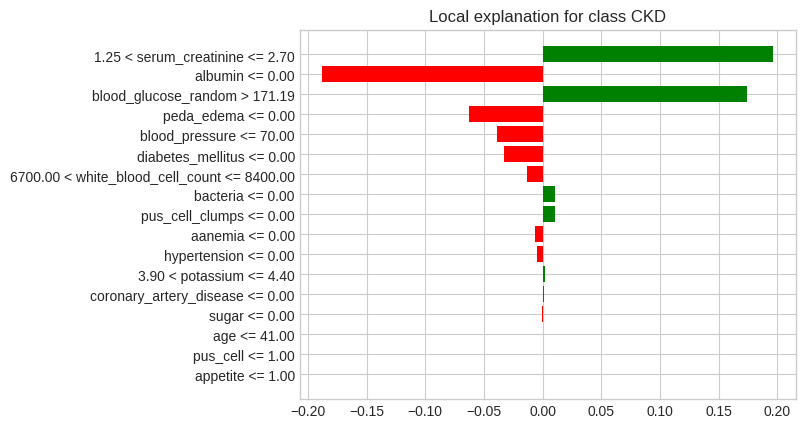

In [ ]:
explanation_figure = explanation.as_pyplot_figure()
plt.show()

In [ ]:
explanation.show_in_notebook()

##### Sample 2

In [ ]:
# Choose a sample (e.g., the first sample from the test set)
sample_index = 45
sample = X_test.iloc[[sample_index]].values[0]

# Get the model's prediction for the chosen sample
prediction = ensemble_2.predict_proba(sample.reshape(1, -1))

# Use Lime to explain the prediction
explanation = explainer.explain_instance(sample, ensemble_2.predict_proba, num_features=len(X_train.columns.tolist()))

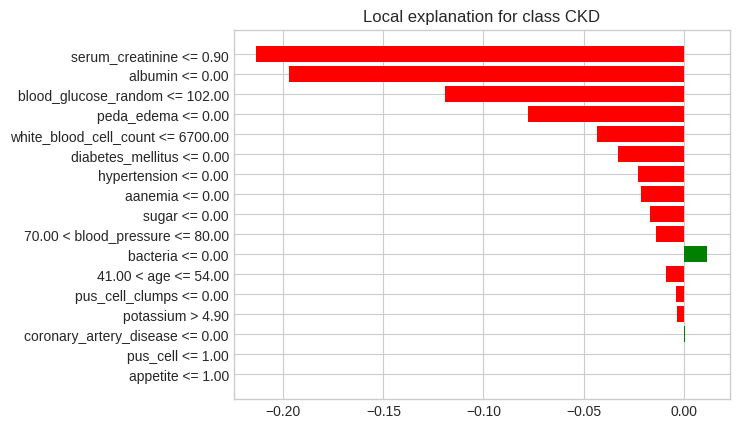

In [ ]:
explanation_figure = explanation.as_pyplot_figure()
plt.show()

In [ ]:
explanation.show_in_notebook()

##### Sample 3

In [ ]:
# Choose a sample (e.g., the first sample from the test set)
sample_index = 27
sample = X_test.iloc[[sample_index]].values[0]

# Get the model's prediction for the chosen sample
prediction = ensemble_2.predict_proba(sample.reshape(1, -1))

# Use Lime to explain the prediction
explanation = explainer.explain_instance(sample, ensemble_2.predict_proba, num_features=len(X_train.columns.tolist()))

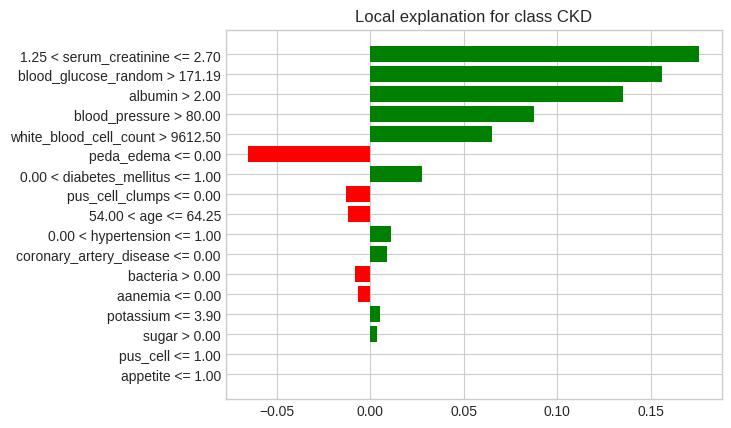

In [ ]:
explanation_figure = explanation.as_pyplot_figure()
plt.show()

In [ ]:
explanation.show_in_notebook()

#### Implementing Eli5 algorithm

In [ ]:
!pip install eli5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 4.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107720 sha256=ceab3753a17cb3a775879cf80fe569e2aafec4b9a8c872c7bf642fd601897ac2
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


In [ ]:
import eli5 as eli
all_model_res = model_res | model_res_std | model_res_norm

In [ ]:
all_model_res

{'Logistic_Regression': {'model': LogisticRegression(C=100),
  'pred_probs': array([[2.78881381e-04, 9.99721119e-01],
         [9.62371572e-01, 3.76284275e-02],
         [2.21357721e-06, 9.99997786e-01],
         [0.00000000e+00, 1.00000000e+00],
         [2.22044605e-16, 1.00000000e+00],
         [0.00000000e+00, 1.00000000e+00],
         [8.29614163e-01, 1.70385837e-01],
         [1.71702974e-01, 8.28297026e-01],
         [8.31447866e-01, 1.68552134e-01],
         [3.37200181e-08, 9.99999966e-01],
         [0.00000000e+00, 1.00000000e+00],
         [9.79550201e-01, 2.04497986e-02],
         [0.00000000e+00, 1.00000000e+00],
         [4.31975387e-06, 9.99995680e-01],
         [0.00000000e+00, 1.00000000e+00],
         [7.71227730e-01, 2.28772270e-01],
         [5.38519500e-01, 4.61480500e-01],
         [8.97907627e-01, 1.02092373e-01],
         [1.62443579e-05, 9.99983756e-01],
         [9.92769165e-01, 7.23083476e-03],
         [3.09461654e-07, 9.99999691e-01],
         [0.00000000e+

In [ ]:
explaination_lst = []
for model in all_model_res:
  try:
    # Explain weights of the logistic regression model
    explanation = eli.explain_weights(all_model_res[model]['model'])
    explaination_lst.append(explanation)
    print(explanation)
    # Visualize the weights
    eli.show_weights(explanation)
  except Exception as e:
    print(f"Could not visualize model :{model}")

Explanation(estimator='LogisticRegression(C=100)', description="\nFeatures with largest coefficients.\nCaveats:\n1. Be careful with features which are not\n   independent - weights don't show their importance.\n2. If scale of input features is different then scale of coefficients\n   will also be different, making direct comparison between coefficient values\n   incorrect.\n3. Depending on regularization, rare features sometimes may have high\n   coefficients; this doesn't mean they contribute much to the\n   classification result for most examples.\n", error=None, method='linear model', is_regression=False, targets=[TargetExplanation(target=1, feature_weights=FeatureWeights(pos=[FeatureWeight(feature='x8', weight=5.659370338945209, std=None, value=None), FeatureWeight(feature='x2', weight=2.567418065938963, std=None, value=None), FeatureWeight(feature='x11', weight=1.1733275142962918, std=None, value=None), FeatureWeight(feature='x12', weight=1.0337000406389554, std=None, value=None),

In [ ]:
explaination_lst[1]

Weight,Feature
0.6525,x8
0.1807,x7
0.0554,x10
0.0521,x15
0.0465,x12
0.0121,x0
0.0007,x9
0,x11
0,x13
0,x14


#### Implementing SHAP algorithm

In [ ]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 538.2/538.2 kB 5.5 MB/s eta 0:00:00


In [ ]:
import shap
explainer = shap.Explainer(all_model_res['Random_Forest_Classifier']['model'])

PermutationExplainer explainer: 93it [00:29,  1.84it/s]


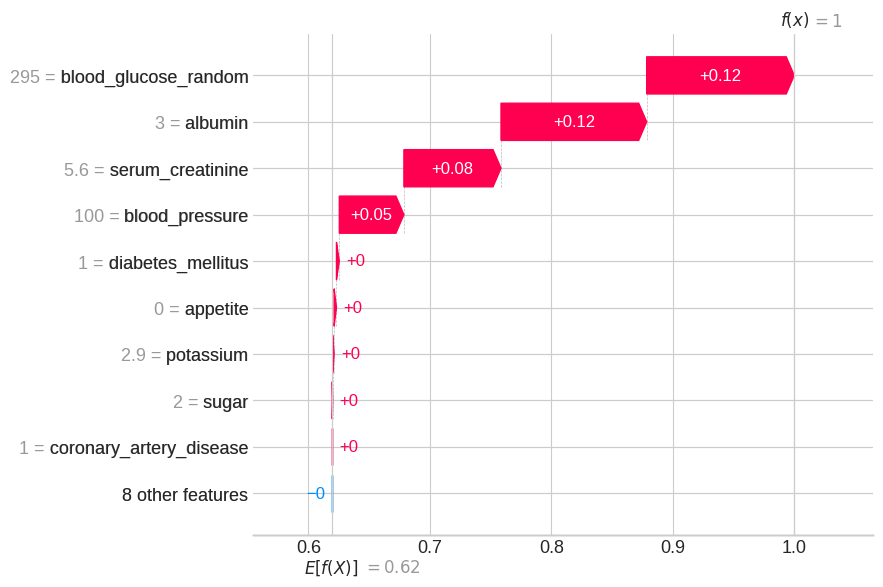

In [ ]:
import shap
model = all_model_res['Catboost_Classifier']['model']

# Fits the explainer
explainer = shap.Explainer(model.predict, X_test)

# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test)

# visualize the first prediction's explanation
shap.plots.waterfall(shap_values[4])

PermutationExplainer explainer: 93it [01:24,  1.01s/it]


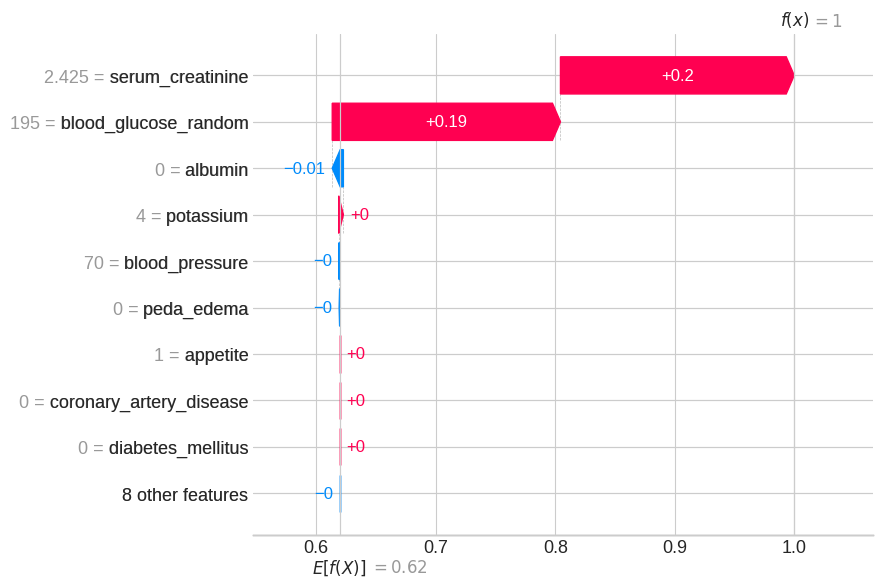

In [ ]:
model = ensemble_2

# Fits the explainer
explainer = shap.Explainer(model.predict, X_test)

# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test)

# visualize the first prediction's explanation
shap.plots.waterfall(shap_values[0])

PermutationExplainer explainer: 93it [01:20,  1.04it/s]


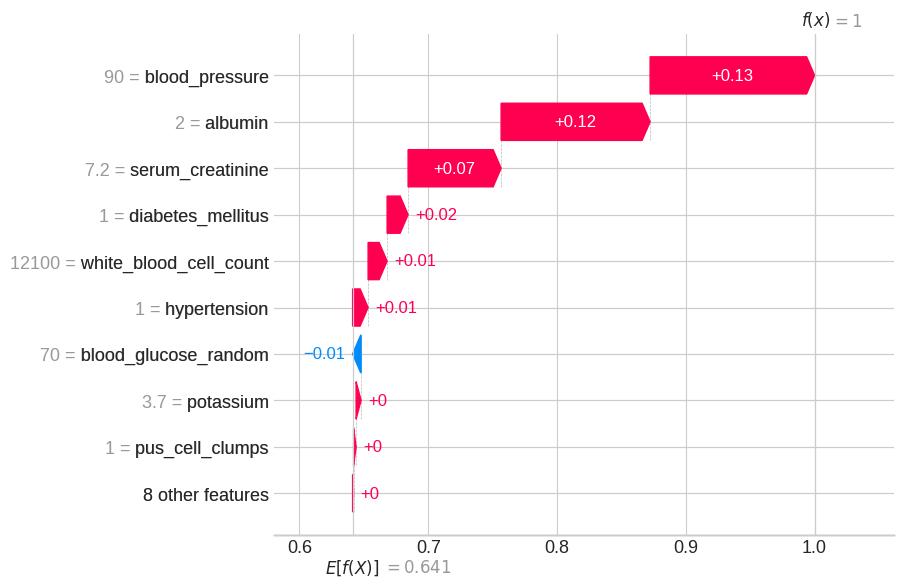

In [ ]:
import shap
model = all_model_res['Stacking_Classifier_2']['model']

# Fits the explainer
explainer = shap.Explainer(model.predict, X_test)

# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test)

# visualize the first prediction's explanation
shap.plots.waterfall(shap_values[10])

PermutationExplainer explainer: 93it [00:26,  2.17it/s]


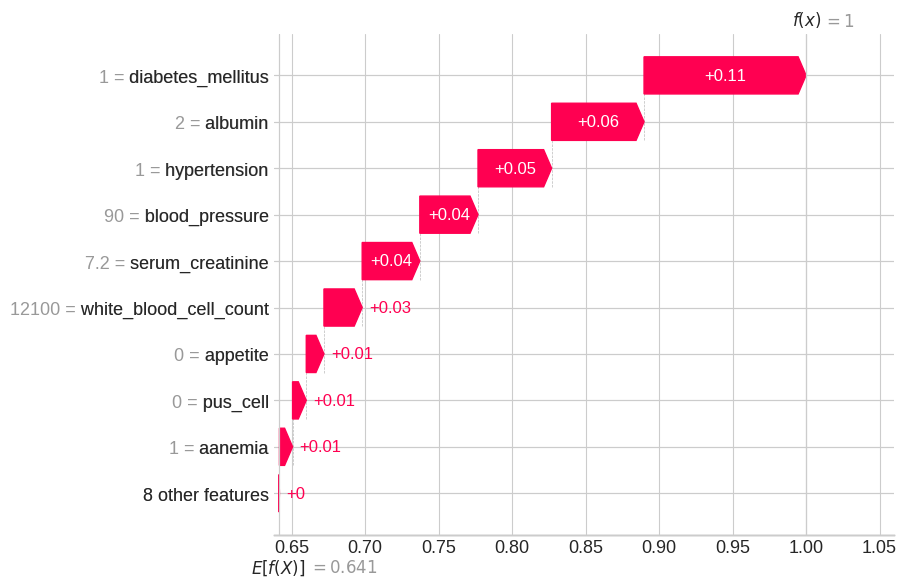

In [ ]:
import shap
model = all_model_res['Random_Forest_Classifier']['model']

# Fits the explainer
explainer = shap.Explainer(model.predict, X_test)

# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test)

# visualize the first prediction's explanation
shap.plots.waterfall(shap_values[10])

PermutationExplainer explainer: 93it [01:39,  1.20s/it]


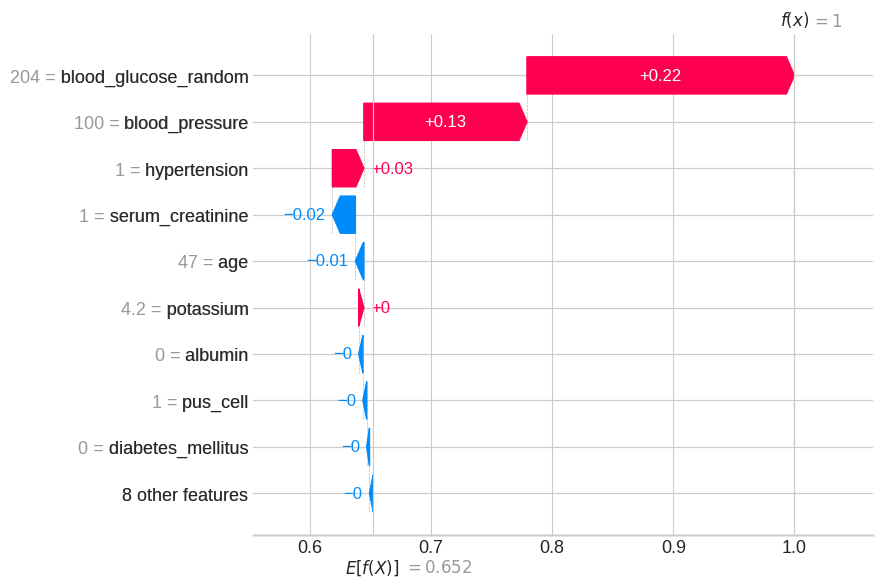

In [ ]:
model = all_model_res['Stacking_Classifier_1']['model']

# Fits the explainer
explainer = shap.Explainer(model.predict, X_test)

# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test)

# visualize the first prediction's explanation
shap.plots.waterfall(shap_values[15])

PermutationExplainer explainer: 93it [05:01,  3.35s/it]


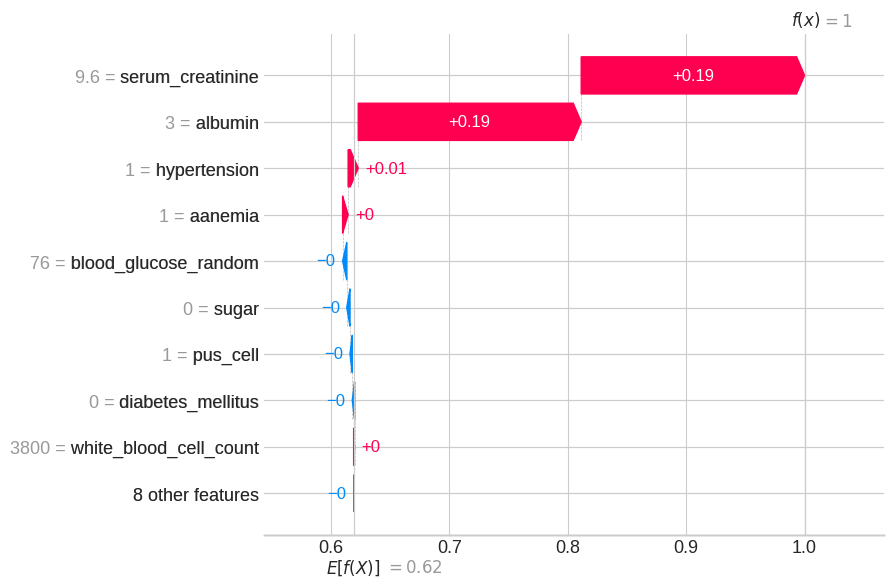

In [ ]:
model = ensemble_1

# Fits the explainer
explainer = shap.Explainer(model.predict, X_test)

# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test)

# visualize the first prediction's explanation
shap.plots.waterfall(shap_values[21])

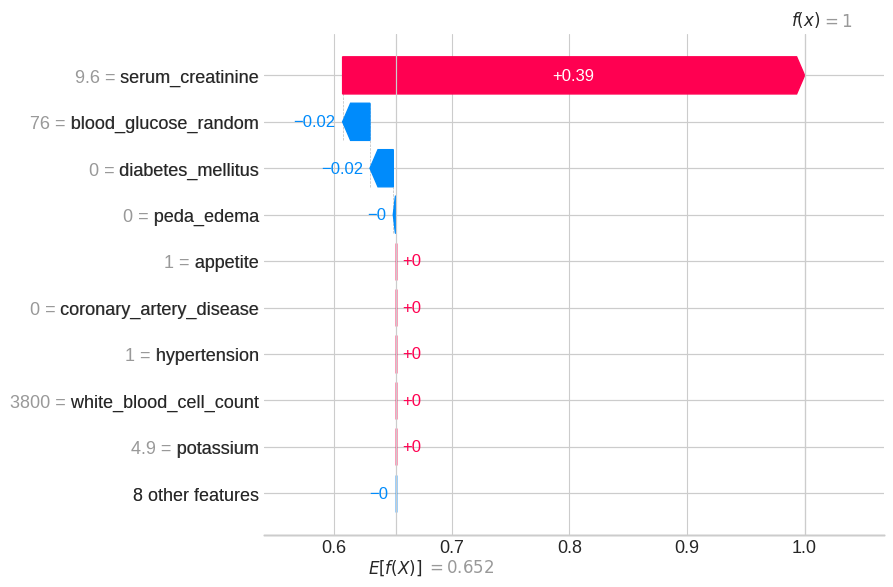

In [ ]:
model = all_model_res['Decision_Tree_Classifier']['model']

# Fits the explainer
explainer = shap.Explainer(model.predict, X_test)

# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test)

# visualize the first prediction's explanation
shap.plots.waterfall(shap_values[21])